# Slides

 ##### https://slides.com/pedromateusalmeida/deck/fullscreen

# Pacotes

In [ ]:
#pip freeze > requirements.txt

In [ ]:
pip install -r requirements.txt

## Carregar Pacotes

In [1]:
# Pacotes básicos
import pandas as pd
import time
from datetime import date
import numpy as np
import statistics
import itertools 
pd.set_option('display.max_columns', None)




import os
import json

# Regex
import re

# Pacote de geração de gráficos
import seaborn as sns
import mpld3
import matplotlib.pyplot as plt
import missingno as msno #Pacote para ver dados missing
import plotly.express as px
import plotly.offline as pyoff
import plotly.graph_objs as go
pyoff.init_notebook_mode(connected=True)
import chart_studio
import chart_studio.plotly as py
import chart_studio.tools as tls


# PCA
from sklearn.decomposition import PCA

# Modelo de relação linear entre variaveis PPscore
import ppscore as pps

# Modelo xgboost
# XGboost Classifer
import xgboost as xgb
from xgboost import XGBClassifier
import treeplot

# Train test split
from sklearn.model_selection import train_test_split

#from sklearn.model_selection import RandomizedSearchCV
#CV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score


#from sklearn.metrics import classification_report # metricas de validação
from sklearn.metrics import accuracy_score

# hyperparameters tuning
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe



# DBscan
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize 




import warnings
warnings.filterwarnings("ignore")

## Funções

In [2]:
def missing_values_table(df):
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        return mis_val_table_ren_columns
    
    
def replace_string(x,a,b):
    return(re.sub(a, b, str(x)))

## API Chart Studio

In [3]:
# API Plotly Chart Studio
username = ''
api_key = ''
chart_studio.tools.set_credentials_file (username = username, api_key = api_key)

# Carregamento dos datasets

In [4]:
data_recom = pd.read_csv("recomendacao.csv", sep = ';' )
data_fator = pd.read_csv("fator_contribuinte.csv", sep = ';' )
data_ocor = pd.read_csv("ocorrencia.csv", sep = ';' )
data_aero = pd.read_csv("aeronave.csv", sep = ';' )
data_ocor_tipo = pd.read_csv("ocorrencia_tipo.csv", sep = ';' )

# Join dos datasets

In [5]:
data_ocor = data_ocor.set_index("codigo_ocorrencia1") 
data_ocor_tipo = data_ocor_tipo.set_index("codigo_ocorrencia1")
data_ocor = data_ocor.join(data_ocor_tipo, on= ['codigo_ocorrencia1'], how='left')
data_ocor = data_ocor.reset_index()

In [6]:
data_ocor = data_ocor.set_index("codigo_ocorrencia2") 
data_aero = data_aero.set_index("codigo_ocorrencia2")
data_ocor = data_ocor.join(data_aero, on= ['codigo_ocorrencia2'], how='left')
data_ocor = data_ocor.reset_index()

In [7]:
data_ocor = data_ocor.set_index("codigo_ocorrencia3") 
data_fator = data_fator.set_index("codigo_ocorrencia3")
data_ocor = data_ocor.join(data_fator, on= ['codigo_ocorrencia3'], how='left')
data_ocor = data_ocor.reset_index()

In [8]:
data_ocor = data_ocor.set_index("codigo_ocorrencia4") 
data_recom = data_recom.set_index("codigo_ocorrencia4")
data_ocor = data_ocor.join(data_recom, on= ['codigo_ocorrencia4'], how='left')
data_ocor = data_ocor.reset_index()

In [9]:
data_ocor = data_ocor.drop(columns = ["codigo_ocorrencia1","codigo_ocorrencia2", "codigo_ocorrencia3", "codigo_ocorrencia4"])

# Tratamentos 

## datetime

In [10]:
data_ocor['ocorrencia_dia'] = pd.to_datetime(data_ocor['ocorrencia_dia'], errors='coerce')
data_ocor['quater_ocorrencia'] =  data_ocor['ocorrencia_dia'].dt.quarter
data_ocor['dia_ocorrencia'] = data_ocor['ocorrencia_dia'].dt.day
data_ocor['mes_ocorrencia'] = data_ocor['ocorrencia_dia'].dt.month
data_ocor['semana_ocorrencia'] = data_ocor['ocorrencia_dia'].dt.dayofweek

In [11]:
data_ocor["hora"], data_ocor["minuto"], data_ocor["segundo"] = data_ocor['ocorrencia_hora'].astype(str).str.split(':',3).str

## Missing

### Visualização dos dados missing

<AxesSubplot:>

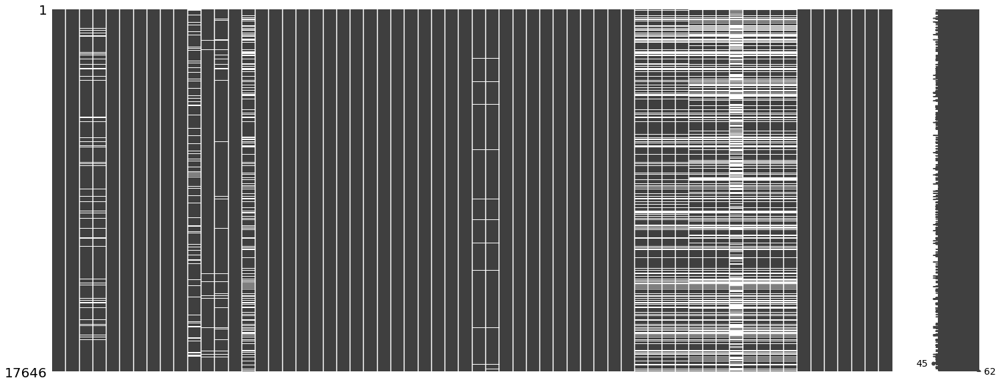

In [12]:
msno.matrix(data_ocor.sample([data_ocor.shape][0][0]))

In [13]:
missing_values_table(data_ocor)

Your selected dataframe has 62 columns.
There are 26 columns that have missing values.


,Missing Values,% of Total Values
recomendacao_dia_feedback,10353,58.7
recomendacao_conteudo,6247,35.4
recomendacao_destinatario,6246,35.4
recomendacao_destinatario_sigla,6246,35.4
recomendacao_status,6246,35.4
recomendacao_dia_encaminhamento,6246,35.4
recomendacao_dia_assinatura,6246,35.4
recomendacao_numero,6246,35.4
fator_aspecto,5181,29.4
fator_condicionante,5181,29.4


### Tratamento dos dados missing

In [14]:
# A ausencia desses dados implica que  não foi identificado ou não tem informação 
# dos fatores contribuintes das ocorrências que tiveram investigações finalizadas.
data_ocor["fator_nome"].fillna("SEM INFORMACAO", inplace=True)
data_ocor["fator_aspecto"].fillna("SEM INFORMACAO", inplace=True)
data_ocor["fator_condicionante"].fillna("SEM INFORMACAO", inplace=True)
data_ocor["fator_area"].fillna("SEM INFORMACAO", inplace=True)

In [15]:
data_ocor = data_ocor.drop_duplicates()

# Describe

In [16]:
data_ocor.describe()

,codigo_ocorrencia,total_recomendacoes,total_aeronaves_envolvidas,aeronave_pmd,aeronave_pmd_categoria,aeronave_assentos,aeronave_ano_fabricacao,aeronave_fatalidades_total,quater_ocorrencia,dia_ocorrencia,mes_ocorrencia,semana_ocorrencia
count,17646.000000,17646.000000,17646.000000,17646.000000,17646.000000,17418.000000,17414.000000,17646.000000,17646.000000,17646.000000,17646.000000,17646.000000
mean,55161.196758,4.125921,1.038196,12960.213930,12960.213930,21.795154,1904.453830,0.989743,2.621047,14.727587,6.901564,2.842741
std,14019.913462,5.555002,0.194317,35548.754335,35548.754335,49.702413,413.830712,2.792484,1.113022,8.682281,3.542912,1.888874
min,39115.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000
25%,44606.750000,0.000000,1.000000,1315.000000,1315.000000,2.000000,1978.000000,0.000000,2.000000,7.000000,4.000000,1.000000
50%,49640.500000,2.000000,1.000000,2155.000000,2155.000000,6.000000,1992.000000,0.000000,3.000000,14.000000,7.000000,3.000000
75%,66430.750000,6.000000,1.000000,6033.000000,6033.000000,9.000000,2006.750000,0.000000,4.000000,22.000000,10.000000,4.000000
max,80259.000000,23.000000,3.000000,396895.000000,396895.000000,384.000000,9999.000000,16.000000,4.000000,31.000000,12.000000,6.000000


In [17]:
data_ocor.head(2)

,codigo_ocorrencia,ocorrencia_classificacao,ocorrencia_latitude,ocorrencia_longitude,ocorrencia_cidade,ocorrencia_uf,ocorrencia_pais,ocorrencia_aerodromo,ocorrencia_dia,ocorrencia_hora,investigacao_aeronave_liberada,investigacao_status,divulgacao_relatorio_numero,divulgacao_relatorio_publicado,divulgacao_dia_publicacao,total_recomendacoes,total_aeronaves_envolvidas,ocorrencia_saida_pista,ocorrencia_tipo,ocorrencia_tipo_categoria,taxonomia_tipo_icao,aeronave_matricula,aeronave_operador_categoria,aeronave_tipo_veiculo,aeronave_fabricante,aeronave_modelo,aeronave_tipo_icao,aeronave_motor_tipo,aeronave_motor_quantidade,aeronave_pmd,aeronave_pmd_categoria,aeronave_assentos,aeronave_ano_fabricacao,aeronave_pais_fabricante,aeronave_pais_registro,aeronave_registro_categoria,aeronave_registro_segmento,aeronave_voo_origem,aeronave_voo_destino,aeronave_fase_operacao,aeronave_tipo_operacao,aeronave_nivel_dano,aeronave_fatalidades_total,fator_nome,fator_aspecto,fator_condicionante,fator_area,recomendacao_numero,recomendacao_dia_assinatura,recomendacao_dia_encaminhamento,recomendacao_dia_feedback,recomendacao_conteudo,recomendacao_status,recomendacao_destinatario_sigla,recomendacao_destinatario,quater_ocorrencia,dia_ocorrencia,mes_ocorrencia,semana_ocorrencia,hora,minuto,segundo
0,40211,INCIDENTE,***,***,RIO DE JANEIRO,RJ,BRASIL,****,2010-03-01,12:00:00,SIM,FINALIZADA,***,NÃO,NaN,0,1,NÃO,TRÁFEGO AÉREO,PERDA DE SEPARAÇÃO / COLISÃO EM VOO | TRÁFEGO ...,MAC,PRCHE,TÁXI AÉREO,HELICÓPTERO,SIKORSKY AIRCRAFT,S-76C,S76,TURBOEIXO,BIMOTOR,5307,5307,14.0,2007.0,BRASIL,BRASIL,HELICÓPTERO,TÁXI AÉREO,FORA DE AERODROMO,FORA DE AERODROMO,DECOLAGEM,TÁXI AÉREO,NENHUM,0,SEM INFORMACAO,SEM INFORMACAO,SEM INFORMACAO,SEM INFORMACAO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,3,0,12,00,00
1,40349,INCIDENTE,NaN,NaN,BELÉM,PA,BRASIL,SBBE,2010-03-01,11:05:00,SIM,FINALIZADA,NaN,NÃO,NaN,0,1,NÃO,COLISÃO COM AVE,COLISÃO COM AVE,BIRD,PRMAB,REGULAR,AVIÃO,AIRBUS INDUSTRIE,A320-232,A320,JATO,BIMOTOR,70000,70000,184.0,2001.0,BRASIL,BRASIL,AVIÃO,REGULAR,FORA DE AERODROMO,FORA DE AERODROMO,DECOLAGEM,REGULAR,LEVE,0,SEM INFORMACAO,SEM INFORMACAO,SEM INFORMACAO,SEM INFORMACAO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,3,0,11,05,00


In [18]:
data_ocor.nunique()

codigo_ocorrencia           6114
ocorrencia_classificacao       3
ocorrencia_latitude         2732
ocorrencia_longitude        2728
ocorrencia_cidade           1133
                            ... 
mes_ocorrencia                12
semana_ocorrencia              7
hora                          25
minuto                        60
segundo                        2
Length: 62, dtype: int64

# Correlação

## Dataset

In [19]:
df = data_ocor[[ "codigo_ocorrencia",'ocorrencia_classificacao', 'ocorrencia_cidade','ocorrencia_uf', 'ocorrencia_aerodromo', 
                'ocorrencia_tipo', 'ocorrencia_tipo_categoria','taxonomia_tipo_icao', 'aeronave_tipo_veiculo','aeronave_fabricante', 
                'aeronave_tipo_icao', 'ocorrencia_latitude', 'ocorrencia_longitude',  'ocorrencia_dia',
                'aeronave_motor_tipo', 'aeronave_motor_quantidade', 'aeronave_pais_fabricante', 'aeronave_registro_categoria',
                'aeronave_voo_origem', 'aeronave_voo_destino','aeronave_fase_operacao', 'aeronave_tipo_operacao','fator_nome',
                'fator_aspecto', 'fator_condicionante','fator_area', 'aeronave_registro_segmento','quater_ocorrencia',
                'dia_ocorrencia','mes_ocorrencia','semana_ocorrencia', 'total_recomendacoes', 'total_aeronaves_envolvidas',
                'aeronave_pmd', 'aeronave_pmd_categoria','aeronave_assentos', 'aeronave_ano_fabricacao', 'hora','minuto',
                'recomendacao_numero', 'recomendacao_dia_assinatura', 'recomendacao_dia_encaminhamento', 'recomendacao_dia_feedback',
                'recomendacao_conteudo', 'recomendacao_status', 'recomendacao_destinatario_sigla', 'recomendacao_destinatario']]

In [20]:
df = df.drop_duplicates()
df["hora"] = df["hora"].str.replace('nan', '0', regex=False).astype(int)
df["minuto"] = df["minuto"].fillna(0).astype(int)

In [21]:
df.describe()

,codigo_ocorrencia,quater_ocorrencia,dia_ocorrencia,mes_ocorrencia,semana_ocorrencia,total_recomendacoes,total_aeronaves_envolvidas,aeronave_pmd,aeronave_pmd_categoria,aeronave_assentos,aeronave_ano_fabricacao,hora,minuto
count,17646.000000,17646.000000,17646.000000,17646.000000,17646.000000,17646.000000,17646.000000,17646.000000,17646.000000,17418.000000,17414.000000,17646.000000,17646.000000
mean,55161.196758,2.621047,14.727587,6.901564,2.842741,4.125921,1.038196,12960.213930,12960.213930,21.795154,1904.453830,14.763346,25.709283
std,14019.913462,1.113022,8.682281,3.542912,1.888874,5.555002,0.194317,35548.754335,35548.754335,49.702413,413.830712,4.830066,17.713648
min,39115.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,44606.750000,2.000000,7.000000,4.000000,1.000000,0.000000,1.000000,1315.000000,1315.000000,2.000000,1978.000000,12.000000,10.000000
50%,49640.500000,3.000000,14.000000,7.000000,3.000000,2.000000,1.000000,2155.000000,2155.000000,6.000000,1992.000000,15.000000,28.000000
75%,66430.750000,4.000000,22.000000,10.000000,4.000000,6.000000,1.000000,6033.000000,6033.000000,9.000000,2006.750000,19.000000,40.000000
max,80259.000000,4.000000,31.000000,12.000000,6.000000,23.000000,3.000000,396895.000000,396895.000000,384.000000,9999.000000,23.000000,59.000000


In [22]:
df.head(1)

,codigo_ocorrencia,ocorrencia_classificacao,ocorrencia_cidade,ocorrencia_uf,ocorrencia_aerodromo,ocorrencia_tipo,ocorrencia_tipo_categoria,taxonomia_tipo_icao,aeronave_tipo_veiculo,aeronave_fabricante,aeronave_tipo_icao,ocorrencia_latitude,ocorrencia_longitude,ocorrencia_dia,aeronave_motor_tipo,aeronave_motor_quantidade,aeronave_pais_fabricante,aeronave_registro_categoria,aeronave_voo_origem,aeronave_voo_destino,aeronave_fase_operacao,aeronave_tipo_operacao,fator_nome,fator_aspecto,fator_condicionante,fator_area,aeronave_registro_segmento,quater_ocorrencia,dia_ocorrencia,mes_ocorrencia,semana_ocorrencia,total_recomendacoes,total_aeronaves_envolvidas,aeronave_pmd,aeronave_pmd_categoria,aeronave_assentos,aeronave_ano_fabricacao,hora,minuto,recomendacao_numero,recomendacao_dia_assinatura,recomendacao_dia_encaminhamento,recomendacao_dia_feedback,recomendacao_conteudo,recomendacao_status,recomendacao_destinatario_sigla,recomendacao_destinatario
0,40211,INCIDENTE,RIO DE JANEIRO,RJ,****,TRÁFEGO AÉREO,PERDA DE SEPARAÇÃO / COLISÃO EM VOO | TRÁFEGO ...,MAC,HELICÓPTERO,SIKORSKY AIRCRAFT,S76,***,***,2010-03-01,TURBOEIXO,BIMOTOR,BRASIL,HELICÓPTERO,FORA DE AERODROMO,FORA DE AERODROMO,DECOLAGEM,TÁXI AÉREO,SEM INFORMACAO,SEM INFORMACAO,SEM INFORMACAO,SEM INFORMACAO,TÁXI AÉREO,1,1,3,0,0,1,5307,5307,14.0,2007.0,12,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Pearson

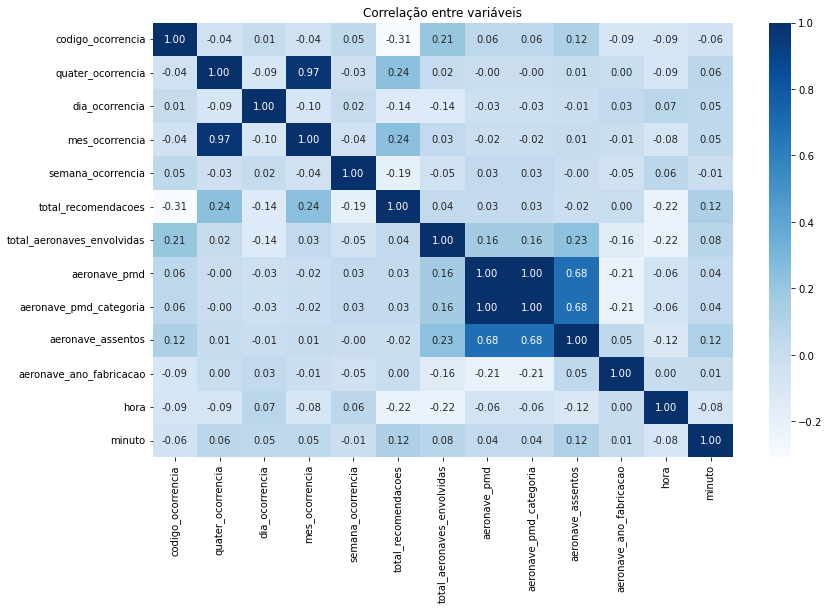

In [23]:
plt.rcParams['figure.figsize'] = [13, 8]
sns.heatmap(df.corr(),
            annot = True,
            fmt = '.2f',
            cmap='Blues')
plt.title('Correlação entre variáveis')
plt.show()

## Spearman

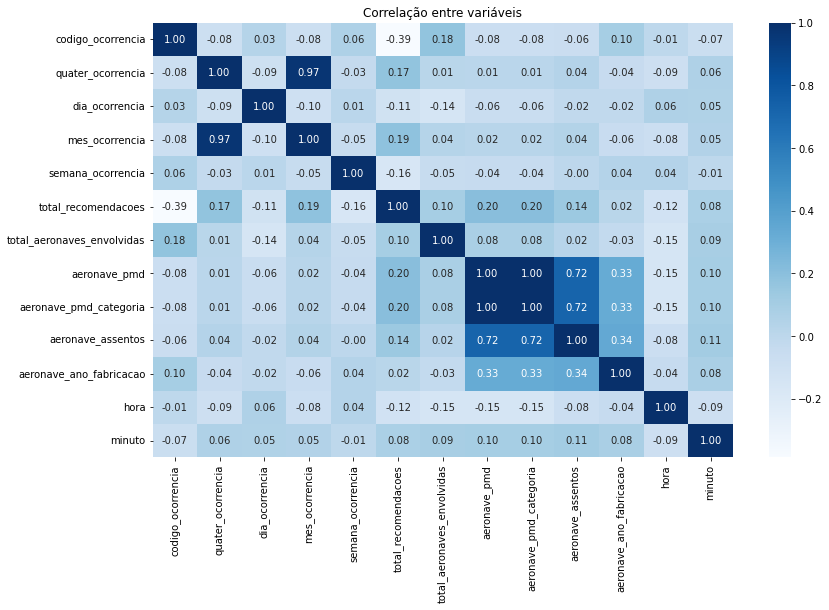

In [24]:
sns.heatmap(df.corr(method='spearman'),
            annot = True,
            fmt = '.2f',
            cmap='Blues')
plt.title('Correlação entre variáveis')
plt.show()

## PPScore

<AxesSubplot:>

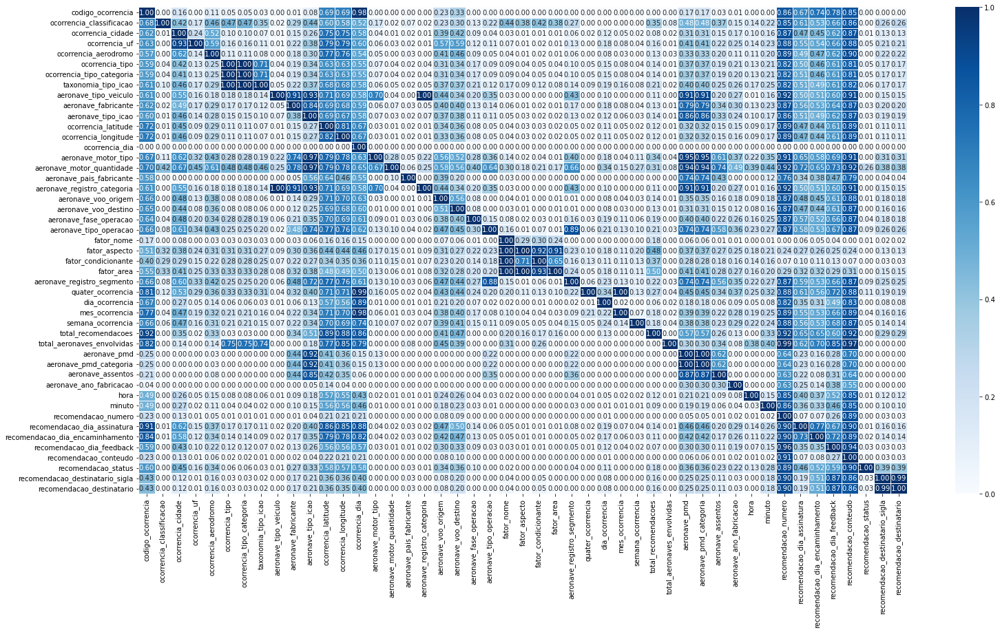

In [25]:
plt.rcParams['figure.figsize'] = [25, 13]
df_matrix = pps.matrix(df)
sns.heatmap(df_matrix, vmin=0, vmax=1, annot = True, fmt = '.2f', cmap="Blues", linewidths=0.5)

## PCA

### Dataset PCA

In [26]:
df = data_ocor[[ 'ocorrencia_classificacao', 'ocorrencia_cidade','ocorrencia_uf', 'ocorrencia_aerodromo', 'investigacao_status',
               'ocorrencia_tipo', 'ocorrencia_tipo_categoria','taxonomia_tipo_icao', 'aeronave_tipo_veiculo','aeronave_fabricante', 
                'aeronave_motor_tipo', 'aeronave_motor_quantidade', 'aeronave_pais_fabricante', 
                'aeronave_registro_categoria',  'aeronave_voo_origem', 'aeronave_voo_destino','aeronave_fase_operacao', 
                'aeronave_tipo_operacao', 'aeronave_registro_segmento','quater_ocorrencia', 'dia_ocorrencia',
                'mes_ocorrencia','semana_ocorrencia',    'total_recomendacoes', 'total_aeronaves_envolvidas',  
                'aeronave_pmd', 'aeronave_pmd_categoria','aeronave_assentos', 
                'aeronave_ano_fabricacao', 'hora','minuto',]].dropna().drop_duplicates()

In [27]:
df = df[(df['investigacao_status'] == "FINALIZADA")]
df["hora"] = df["hora"].astype(int)
df["minuto"] = df["minuto"].astype(int)
df = df.drop(columns = ["investigacao_status"])

### Tratamento

In [28]:
# Em diversas colunas existe a presença baixa, mesmo que baixa de casos com preenchimento ***
# Dado os relatrórios presentes na pagina https://dados.gov.br/dataset/ocorrencias-aeronauticas-da-aviacao-civil-brasileira
# O entendimento adotado é de que não há dados ou informação.

# Trecho no relatório:
# Dados indeterminados foram denotados com a nomenclatura '***'. Por exemplo,
# a impossibilidade de identicar uma aeronave consumida pelo fogo apos um acidente
# esta registrada com essa nomenclatura na base de dados. (Aviaçao de Instruçao - Sumario Estatastico 2010-2019, PG 8)

In [29]:
df_col_list = list(['ocorrencia_classificacao', 'ocorrencia_cidade', 'ocorrencia_uf', 'ocorrencia_aerodromo', 'ocorrencia_tipo', 'ocorrencia_tipo_categoria',
                         'taxonomia_tipo_icao', 'aeronave_tipo_veiculo', 'aeronave_fabricante', 'aeronave_motor_tipo', 'aeronave_motor_quantidade',
                         'aeronave_pais_fabricante', 'aeronave_registro_categoria', 'aeronave_voo_origem', 'aeronave_voo_destino', 'aeronave_fase_operacao',
                         'aeronave_tipo_operacao', 'aeronave_registro_segmento'])

for i in range(len(df_col_list)):
        df[f'{df_col_list[i]}'] = df[f'{df_col_list[i]}'].str.replace('***', 'SEM INFORMACAO', regex=False)
        df[f'{df_col_list[i]}'] = df[f'{df_col_list[i]}'].str.replace('SEM INFORMACAO*', 'SEM INFORMACAO', regex=False)

In [30]:
lista_coluns_str = list(['ocorrencia_classificacao', 'ocorrencia_cidade', 'ocorrencia_uf', 'ocorrencia_aerodromo', 'ocorrencia_tipo', 'ocorrencia_tipo_categoria',
                         'taxonomia_tipo_icao', 'aeronave_tipo_veiculo', 'aeronave_fabricante', 'aeronave_motor_tipo', 'aeronave_motor_quantidade',
                         'aeronave_pais_fabricante', 'aeronave_registro_categoria', 'aeronave_voo_origem', 'aeronave_voo_destino', 'aeronave_fase_operacao',
                         'aeronave_tipo_operacao', 'aeronave_registro_segmento'])


strings_old = ['|','^','á','é','í','ó','ú','Á','É','Í','Ó','Ú','â','ê','î','ô','Â','Ê','Î','Ô','ã','õ','Ã','Õ','ç','Ç', ':', ' ','/','>','<']
strings_new = ['' ,'','a','e','i','o','u','a','e','i','o','u','a','e','i','o','a','e','i','o','a','o','a','o','c','c', '', '_',  '_','','']


for i in range(len(lista_coluns_str)):
    for j in range(len(strings_old)):
        df[f"{lista_coluns_str[i]}"] = df[f"{lista_coluns_str[i]}"].apply(replace_string, args=(strings_old[j], strings_new[j]))
        df[f"{lista_coluns_str[i]}"] = df[f"{lista_coluns_str[i]}"].str.lower()

In [31]:
dft = df
dft = pd.get_dummies(dft, columns =  ['ocorrencia_tipo_categoria','ocorrencia_classificacao', 'ocorrencia_cidade', 'ocorrencia_uf', 'ocorrencia_aerodromo',
                                      'taxonomia_tipo_icao', 'aeronave_tipo_veiculo', 'aeronave_fabricante', 'ocorrencia_tipo',
                                      'aeronave_motor_tipo', 'aeronave_motor_quantidade', 'aeronave_pais_fabricante', 'aeronave_registro_categoria',
                                      'aeronave_voo_origem', 'aeronave_voo_destino', 'aeronave_fase_operacao', 'aeronave_tipo_operacao',
                                      'aeronave_registro_segmento'], dummy_na=False)

### Calculo PCA

In [32]:
# You must normalize the data before applying the fit method
#dft_normalized = normalize(dft)
dft_normalized = StandardScaler().fit_transform(dft)
pca = PCA(n_components=dft_normalized.shape[1])
pca.fit(dft_normalized)

PCA(n_components=3138)

In [33]:
# Reformat and view results
loadings = pd.DataFrame(pca.components_.T, 
                        columns=['PC%s' % _ for _ in range(dft_normalized.shape[1])],
                        index=dft.columns)


In [34]:
loadings.head(5)

PC0       PC1       PC2       PC3       PC4  \
quater_ocorrencia   -0.005514 -0.007238  0.016792 -0.022028  0.007862   
dia_ocorrencia      -0.000877  0.006442  0.020295 -0.011987  0.004946   
mes_ocorrencia      -0.004891 -0.006826  0.015289 -0.023394  0.009537   
semana_ocorrencia   -0.002917  0.001843  0.015669  0.010835  0.003627   
total_recomendacoes -0.045159  0.012795 -0.033401  0.061472  0.025962   

                          PC5       PC6       PC7       PC8       PC9  \
quater_ocorrencia    0.000901  0.026810 -0.021620  0.016838  0.011562   
dia_ocorrencia      -0.005138  0.003524  0.002124 -0.012208 -0.005889   
mes_ocorrencia       0.001776  0.027805 -0.022603  0.017521  0.011891   
semana_ocorrencia   -0.002792  0.008873  0.021055  0.000587  0.011447   
total_recomendacoes  0.004130  0.007418 -0.021403 -0.001015  0.056479   

                         PC10      PC11      PC12      PC13      PC14  \
quater_ocorrencia    0.006207 -0.026999  0.000082  0.012629 -0.001336   
dia_ocorrencia      -0.004149 -0.012665 -0.004370  0.012889  0.006613   
mes_ocorrencia       0.008058 -0.027871  0.000701  0.012378 -0.002363   
semana_ocorrencia    0.016787 -0.015657 -0.004520 -0.017484  0.007149   
total_recomendacoes -0.019303 -0.009791  0.003726  0.009283 -0.023373   

                         PC15      PC16      PC17      PC18      PC19  \
quater_ocorrencia   -0.009048 -0.041741  0.024376 -0.020751 -0.014138   
dia_ocorrencia       0.003107  0.012539 -0.019586 -0.002898  0.014211   
mes_ocorrencia      -0.010125 -0.043897  0.024646 -0.020296 -0.013005   
semana_ocorrencia    0.004462  0.009036  0.005815 -0.009215  0.000456   
total_recomendacoes  0.032644  0.013487  0.003948  0.019446 -0.006683   

                         PC20      PC21      PC22      PC23      PC24  \
quater_ocorrencia   -0.015038 -0.016629  0.024224  0.021547 -0.019408   
dia_ocorrencia       0.001236 -0.003713  0.006950 -0.005589  0.012004   
mes_ocorrencia      -0.013207 -0.014170  0.025520  0.021186 -0.019983   
semana_ocorrencia    0.011767 -0.013359  0.000236  0.001162  0.015459   
total_recomendacoes  0.005882 -0.041080  0.026454  0.020093  0.003251   

                         PC25      PC26      PC27      PC28      PC29  \
quater_ocorrencia    0.014153  0.040525 -0.028564  0.014684 -0.001060   
dia_ocorrencia      -0.014874  0.008641  0.003550 -0.013862  0.001185   
mes_ocorrencia       0.011054  0.042743 -0.026896  0.013876 -0.004075   
semana_ocorrencia   -0.003304 -0.006519  0.022260  0.011151  0.009513   
total_recomendacoes  0.011789  0.011828  0.016448 -0.026888  0.017516   

                         PC30      PC31      PC32      PC33      PC34  \
quater_ocorrencia   -0.006520 -0.010888  0.038249 -0.020495  0.010424   
dia_ocorrencia      -0.001831  0.025376 -0.008368 -0.005106  0.004019   
mes_ocorrencia      -0.006477 -0.014907  0.039696 -0.020164  0.013468   
semana_ocorrencia   -0.006249  0.011364  0.014349  0.001568  0.004842   
total_recomendacoes  0.002014 -0.044986 -0.006154 -0.000909 -0.003028   

                         PC35      PC36      PC37      PC38      PC39  \
quater_ocorrencia   -0.016316  0.018081 -0.020739 -0.015665  0.003267   
dia_ocorrencia      -0.012108  0.017941 -0.003692 -0.009033  0.000113   
mes_ocorrencia      -0.013733  0.016687 -0.021646 -0.013686  0.004480   
semana_ocorrencia    0.006982  0.002235  0.010090  0.028817  0.006860   
total_recomendacoes  0.011482  0.029847  0.003795  0.010192 -0.023299   

                         PC40      PC41      PC42      PC43      PC44  \
quater_ocorrencia   -0.009713  0.015109  0.014935 -0.016914  0.014825   
dia_ocorrencia       0.004858  0.002968 -0.017528 -0.008316  0.001740   
mes_ocorrencia      -0.012167  0.013730  0.014341 -0.015827  0.012885   
semana_ocorrencia   -0.000249  0.000176  0.016356  0.000487  0.012775   
total_recomendacoes -0.005259 -0.013680  0.005141  0.016325  0.004613   

                         PC45      PC46      PC47      PC48      PC49  \
qu

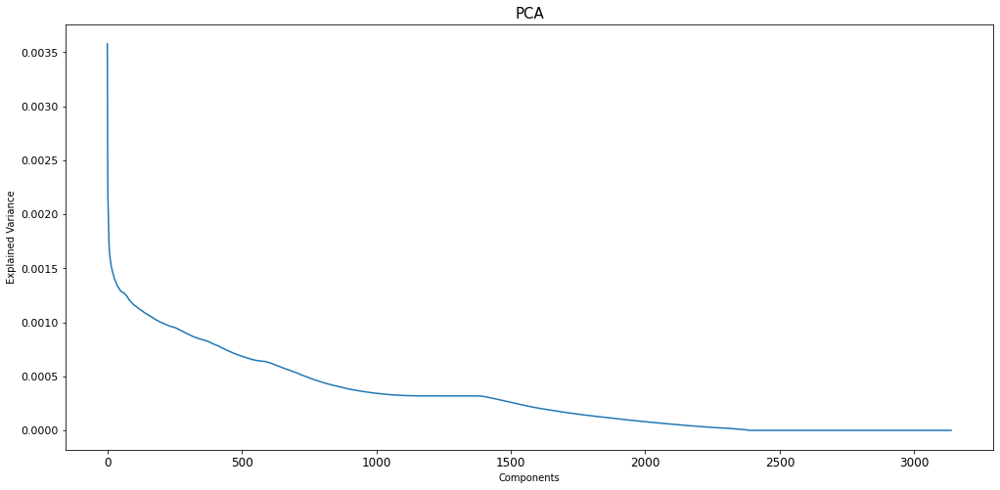

In [35]:
plt.rcParams['figure.figsize'] = [17, 8]
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 11
plt.plot(pca.explained_variance_ratio_)
plt.title('PCA', fontsize=15)
plt.ylabel('Explained Variance')
plt.xlabel('Components')
plt.show()

# Modelagem

In [36]:
# seleção de dados para o modelo
# Objetivo: classificador de ocorrências

## Seleção de features para o modelo

In [37]:
df = data_ocor[[ "codigo_ocorrencia",'ocorrencia_classificacao', 'ocorrencia_cidade','ocorrencia_uf', 'ocorrencia_aerodromo', 'investigacao_status',
               'ocorrencia_tipo', 'ocorrencia_tipo_categoria','taxonomia_tipo_icao', 'aeronave_tipo_veiculo','aeronave_fabricante', 'aeronave_tipo_icao',
                'aeronave_motor_tipo', 'aeronave_motor_quantidade', 'aeronave_pais_fabricante', 'aeronave_registro_categoria',
                'aeronave_voo_origem', 'aeronave_voo_destino','aeronave_fase_operacao', 'aeronave_tipo_operacao','fator_nome',
                'fator_aspecto', 'fator_condicionante','fator_area', 'aeronave_registro_segmento','quater_ocorrencia',
                'dia_ocorrencia','mes_ocorrencia','semana_ocorrencia', 'total_recomendacoes', 'total_aeronaves_envolvidas',
                'aeronave_pmd', 'aeronave_pmd_categoria','aeronave_assentos', 'aeronave_ano_fabricacao', 'hora','minuto']]

## Filtros e drops

In [38]:
df = df[(df['investigacao_status'] == "FINALIZADA")]
df = df.dropna()
df = df.drop_duplicates()
df = df.drop(columns = ["investigacao_status"])
df["hora"] = df["hora"].astype(int)
df["minuto"] = df["minuto"].astype(int)

## dados missing df

<AxesSubplot:>

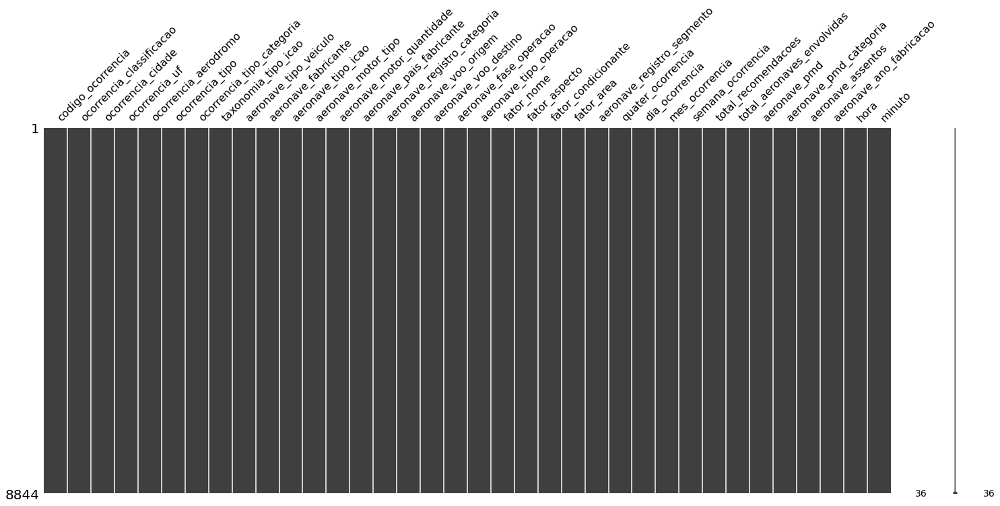

In [39]:
msno.matrix(df.sample([df.shape][0][0]))

In [40]:
missing_values_table(df)

Your selected dataframe has 36 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [41]:
# Em diversas colunas existe a presença baixa, mesmo que baixa de casos com preenchimento ***
# Dado os relatrórios presentes na pagina https://dados.gov.br/dataset/ocorrencias-aeronauticas-da-aviacao-civil-brasileira
# O entendimento adotado é de que não há dados ou informação.

# Trecho no relatório:
# Dados indeterminados foram denotados com a nomenclatura '***'. Por exemplo,
# a impossibilidade de identicar uma aeronave consumida pelo fogo apos um acidente
# esta registrada com essa nomenclatura na base de dados. (Aviaçao de Instruçao - Sumario Estatastico 2010-2019, PG 8)

In [42]:
df_col_list = list(df[[ 'ocorrencia_classificacao', 'ocorrencia_cidade', 'ocorrencia_uf', 'ocorrencia_aerodromo',
                       'ocorrencia_tipo', 'ocorrencia_tipo_categoria', 'taxonomia_tipo_icao', 'aeronave_tipo_veiculo',
                       'aeronave_fabricante', 'aeronave_tipo_icao', 'aeronave_motor_tipo', 'aeronave_motor_quantidade',
                       'aeronave_pais_fabricante', 'aeronave_registro_categoria', 'aeronave_voo_origem', 'aeronave_voo_destino',
                       'aeronave_fase_operacao', 'aeronave_tipo_operacao', 'fator_nome', 'fator_aspecto', 'fator_condicionante',
                       'fator_area', 
                       'aeronave_registro_segmento',]])

for i in range(len(df_col_list)):
        df[f'{df_col_list[i]}'] = df[f'{df_col_list[i]}'].str.replace('***', 'SEM INFORMACAO', regex=False)
        df[f'{df_col_list[i]}'] = df[f'{df_col_list[i]}'].str.replace('SEM INFORMACAO*', 'SEM INFORMACAO', regex=False)

## Tratamento de caracteres especiais

In [43]:
lista_coluns_str = list(['ocorrencia_cidade', 'ocorrencia_uf', 'ocorrencia_aerodromo', 'ocorrencia_tipo', 'ocorrencia_tipo_categoria',  
                         'taxonomia_tipo_icao', 'aeronave_tipo_veiculo', 'aeronave_fabricante', 'aeronave_tipo_icao', 'aeronave_motor_tipo',  
                         'aeronave_motor_quantidade', 'aeronave_pais_fabricante', 'aeronave_registro_categoria', 'aeronave_voo_origem', 
                         'aeronave_voo_destino', 'aeronave_fase_operacao', 'aeronave_tipo_operacao', 'fator_nome', 'fator_aspecto', 
                         'fator_condicionante', 'fator_area', 
                         'aeronave_registro_segmento'])

def replace_string(x,a,b):
    return(re.sub(a, b, str(x)))

strings_old = ['|','^','á','é','í','ó','ú','Á','É','Í','Ó','Ú','â','ê','î','ô','Â','Ê','Î','Ô','ã','õ','Ã','Õ','ç','Ç', ':', ' ','/','>','<']
strings_new = ['' ,'','a','e','i','o','u','a','e','i','o','u','a','e','i','o','a','e','i','o','a','o','a','o','c','c', '', '_',  '_','','']

for i in range(len(lista_coluns_str)):
    for j in range(len(strings_old)):
        df[f"{lista_coluns_str[i]}"] = df[f"{lista_coluns_str[i]}"].apply(replace_string, args=(strings_old[j], strings_new[j]))
        df[f"{lista_coluns_str[i]}"] = df[f"{lista_coluns_str[i]}"].str.lower()

In [44]:
df = df.set_index("codigo_ocorrencia")

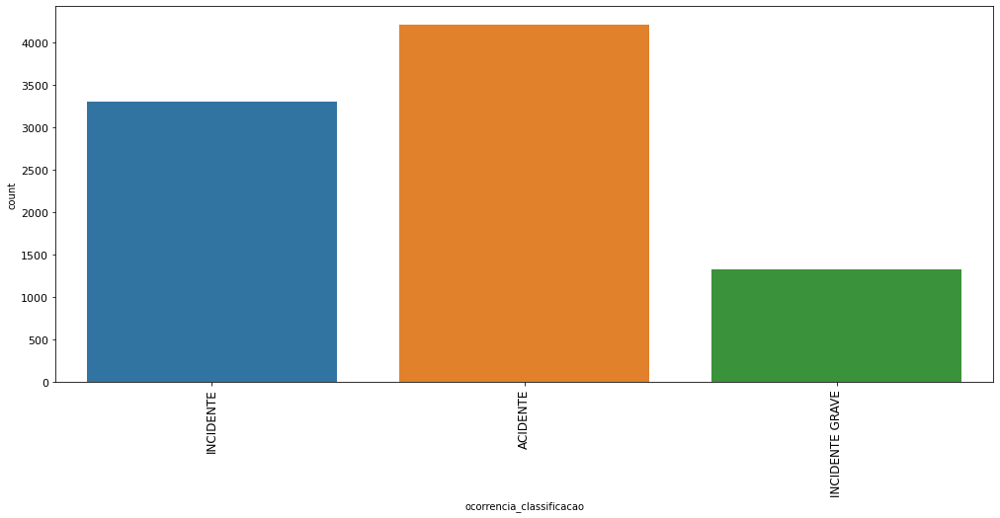

In [45]:
plt.rcParams['figure.figsize'] = [17, 7]
sns.countplot(x= "ocorrencia_classificacao", data = df)
plt.xticks(rotation=90);

# Treinamento

## Separação de features preditivas e valor a ser predito

In [46]:
df_y = df[["ocorrencia_classificacao"]]
df_x = df.drop(columns = ["ocorrencia_classificacao"])

## Dummies do dataset

In [47]:
df_x = pd.get_dummies(df_x, columns =  [ 'ocorrencia_cidade', 'ocorrencia_uf', 'ocorrencia_aerodromo', 'ocorrencia_tipo', 'ocorrencia_tipo_categoria', 
                                        'taxonomia_tipo_icao', 'aeronave_tipo_veiculo', 'aeronave_fabricante', 'aeronave_tipo_icao', 'aeronave_motor_tipo', 
                                        'aeronave_motor_quantidade', 'aeronave_pais_fabricante', 'aeronave_registro_categoria', 'aeronave_voo_origem', 
                                        'aeronave_voo_destino', 'aeronave_fase_operacao', 'aeronave_tipo_operacao', 'fator_nome', 'fator_aspecto', 
                                        'fator_condicionante', 'fator_area', 'aeronave_registro_segmento'], dummy_na=False)

## Segmentação em treino e teste

In [48]:
X_train, X_test, y_train, y_test = train_test_split(df_x, df_y, random_state=0)

## Tratamento na nomeclatura das colunas

In [49]:
regex = re.compile(r"\[|\]|<", re.IGNORECASE)

X_train.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<', '>'))) else col for col in X_train.columns.values]
X_test.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<', '>'))) else col for col in X_test.columns.values]
y_train.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<', '>'))) else col for col in y_train.columns.values]

## GridSearch

In [50]:
# Obs: Essa função de gridsearch já possui um metodo de crossvalidation
# Metodo: grid search bayesian optimization

def objective(space):

    warnings.filterwarnings(action='ignore', category=DeprecationWarning)
    classifier = xgb.XGBClassifier(n_estimators = space['n_estimators'],
                            max_depth = int(space['max_depth']),
                            learning_rate = space['learning_rate'],
                            gamma = space['gamma'],
                            min_child_weight = space['min_child_weight'],
                            subsample = space['subsample'],
                            colsample_bytree = space['colsample_bytree']
                            )
    
    classifier.fit(X_train, y_train)

    #Cross Validation
    accuracies = cross_val_score(estimator = classifier, X = X_train, y = y_train, cv = 5)
    CrossValMean = accuracies.mean()

    print("CrossValMean:", CrossValMean)

    return{'loss':1-CrossValMean, 'status': STATUS_OK }

space = {
    'max_depth' : hp.choice('max_depth', range(5, 30, 1)),
    'learning_rate' : hp.quniform('learning_rate', 0.01, 0.5, 0.01),
    'n_estimators' : hp.choice('n_estimators', range(20, 205, 5)),
    'gamma' : hp.quniform('gamma', 0, 0.50, 0.01),
    'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
    'subsample' : hp.quniform('subsample', 0.1, 1, 0.01),
    'colsample_bytree' : hp.quniform('colsample_bytree', 0.1, 1.0, 0.01)}

trials = Trials()
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=15,
            trials=trials)

print("Best: ", best)

[21:25:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:25:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:26:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:26:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

## Treino

In [51]:
classifier = XGBClassifier(n_estimators = best['n_estimators'],
                            max_depth = best['max_depth'],
                            learning_rate = best['learning_rate'],
                            gamma = best['gamma'],
                            min_child_weight = best['min_child_weight'],
                            subsample = best['subsample'],
                            colsample_bytree = best['colsample_bytree'])

classifier.fit(X_train, y_train)

[22:02:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.68,
              enable_categorical=False, gamma=0.17, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.34, max_delta_step=0, max_depth=17,
              min_child_weight=2.0, missing=nan, monotone_constraints='()',
              n_estimators=15, n_jobs=12, num_parallel_tree=1,
              objective='multi:softprob', predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=None, subsample=0.66,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [52]:
y_pred = classifier.predict(X_test)
score = accuracy_score(y_test, y_pred)
print('Accuracy: %.3f' % score)

Accuracy: 0.909


## Cross Validation

In [53]:
# Obs: Na sessão 7.6 GridSearch o cross validation já é implementado.
# Portanto os parametros finais já passaram por uma cross validation

In [54]:
accuracies = cross_val_score(estimator = classifier, X = X_train, y = y_train, cv = 6)
CrossValMean = accuracies.mean()
print("Final CrossValMean: ", CrossValMean)

[22:02:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:03:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:03:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:03:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

In [55]:
CrossValSTD = accuracies.std()

CrossValSTD

0.010055730970715819

##  Feature Importance

[treeplot] >Set path in environment.
[treeplot] >Best detected tree: 14


Text(0.5, 1.0, 'FEATURE IMPORTANCE')

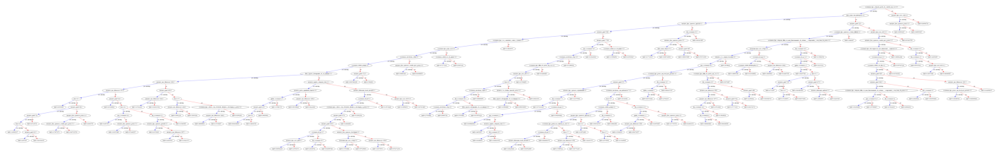

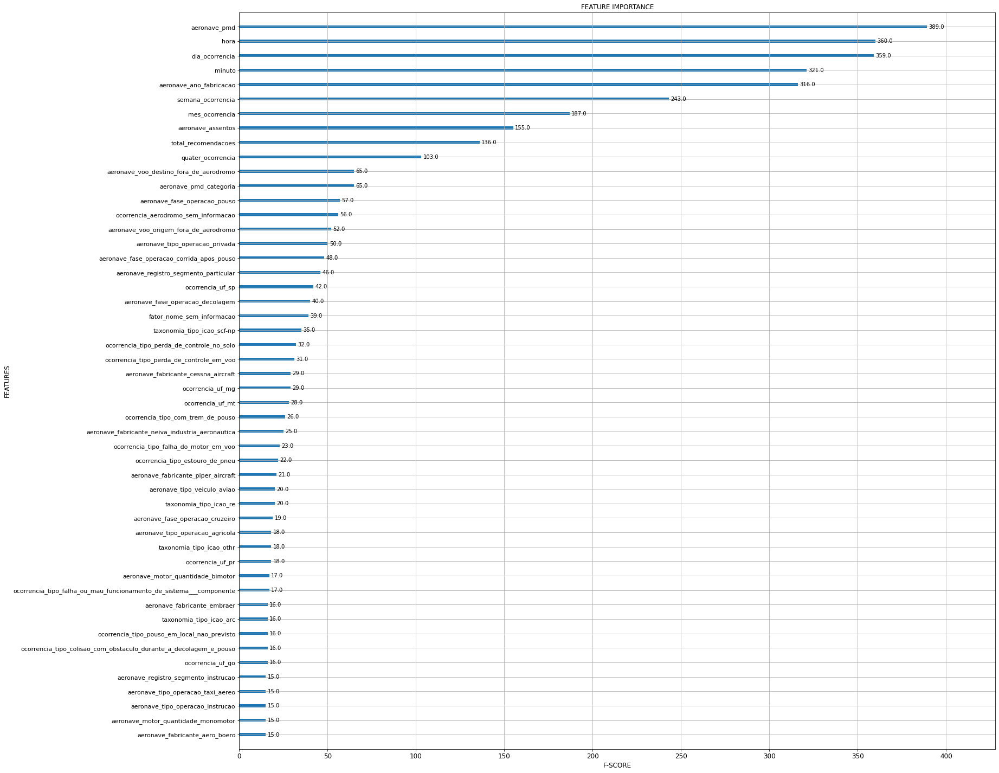

In [56]:
ax = treeplot.plot(classifier)
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
plt.xlabel('F-SCORE', fontsize=12 )
plt.ylabel('FEATURES', fontsize=12)
plt.title('FEATURE IMPORTANCE', fontsize=12)

 ## Learning Curve

In [57]:
eval_set = [(X_train, y_train), (X_test, y_test)]
classifier.fit(X_train, y_train, eval_metric= ["auc", "mlogloss"], eval_set=eval_set)

# make predictions for test data
y_pred = classifier.predict(X_test)
# evaluate predictions
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

[0]	validation_0-auc:0.97927	validation_0-mlogloss:0.76102	validation_1-auc:0.95782	validation_1-mlogloss:0.78733
[1]	validation_0-auc:0.98866	validation_0-mlogloss:0.56692	validation_1-auc:0.96523	validation_1-mlogloss:0.61599
[2]	validation_0-auc:0.99276	validation_0-mlogloss:0.44098	validation_1-auc:0.97113	validation_1-mlogloss:0.50575
[3]	validation_0-auc:0.99455	validation_0-mlogloss:0.35098	validation_1-auc:0.97288	validation_1-mlogloss:0.43173
[4]	validation_0-auc:0.99571	validation_0-mlogloss:0.28840	validation_1-auc:0.97455	validation_1-mlogloss:0.38003
[5]	validation_0-auc:0.99675	validation_0-mlogloss:0.24019	validation_1-auc:0.97580	validation_1-mlogloss:0.34143
[6]	validation_0-auc:0.99735	validation_0-mlogloss:0.20355	validation_1-auc:0.97696	validation_1-mlogloss:0.31350
[7]	validation_0-auc:0.99775	validation_0-mlogloss:0.17716	validation_1-auc:0.97694	validation_1-mlogloss:0.29593
[8]	validation_0-auc:0.99813	validation_0-mlogloss:0.15752	validation_1-auc:0.97851	vali

In [58]:
# retrieve performance metrics
results = classifier.evals_result()
epochs = len(results['validation_0']['auc'])
x_axis = range(0, epochs)

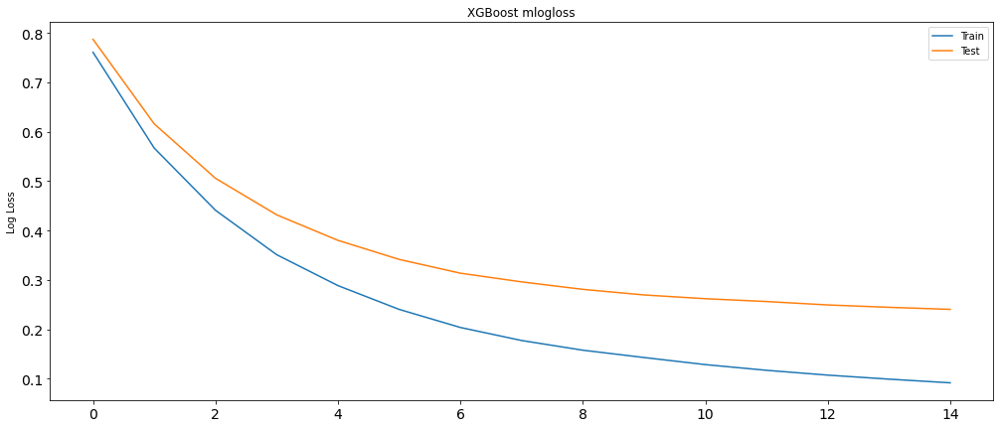

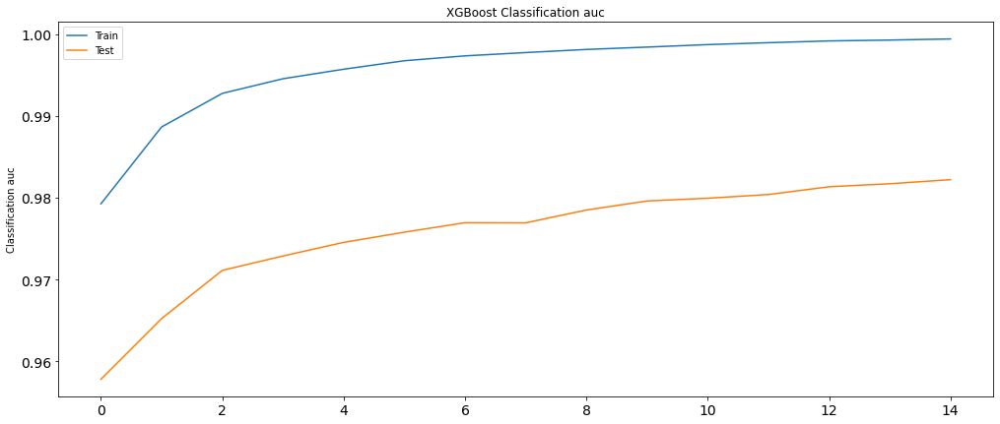

In [59]:

# plot log loss
fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_0']['mlogloss'], label='Train')
ax.plot(x_axis, results['validation_1']['mlogloss'], label='Test')
ax.legend()
plt.ylabel('Log Loss')
plt.title('XGBoost mlogloss')
plt.show()
# plot classification error
fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_0']['auc'], label='Train')
ax.plot(x_axis, results['validation_1']['auc'], label='Test')
ax.legend()
plt.ylabel('Classification auc')
plt.title('XGBoost Classification auc')
plt.show()

# Clusterização

## Carregando BD e modelagem para Clusterização

In [60]:
df_clus = data_ocor[[ 'ocorrencia_classificacao', 'ocorrencia_cidade','ocorrencia_uf', 'ocorrencia_aerodromo', 'investigacao_status',
               'ocorrencia_tipo', 'ocorrencia_tipo_categoria','taxonomia_tipo_icao', 'aeronave_tipo_veiculo','aeronave_fabricante', 'aeronave_tipo_icao',
                'aeronave_motor_tipo', 'aeronave_motor_quantidade', 'aeronave_pais_fabricante', 'aeronave_registro_categoria',
                'aeronave_voo_origem', 'aeronave_voo_destino','aeronave_fase_operacao', 'aeronave_tipo_operacao',
                'aeronave_registro_segmento','quater_ocorrencia',
                'dia_ocorrencia','mes_ocorrencia','semana_ocorrencia', 'total_recomendacoes', 'total_aeronaves_envolvidas',
                'aeronave_pmd', 'aeronave_pmd_categoria','aeronave_assentos', 'aeronave_ano_fabricacao', 'hora','minuto']].dropna().copy()

df_clus = df_clus[(df_clus['investigacao_status'] == "FINALIZADA")]
df_clus = df_clus.dropna()
df_clus = df_clus.drop_duplicates()
df_clus = df_clus.drop(columns = ["investigacao_status"])
df_clus["hora"] = df_clus["hora"].astype(int)
df_clus["minuto"] = df_clus["minuto"].astype(int)

df_clus = df_clus.reset_index()
df_clus = df_clus.drop(columns = ["index"])

In [61]:
df_clus = df_clus.reset_index()
df_clus = df_clus.drop(columns = ["index"])

In [62]:
df_col_list = list(df_clus[[ 'ocorrencia_classificacao', 'ocorrencia_cidade', 'ocorrencia_uf', 'ocorrencia_aerodromo', 
                     'ocorrencia_tipo', 'ocorrencia_tipo_categoria', 'taxonomia_tipo_icao', 'aeronave_tipo_veiculo', 'aeronave_fabricante',
                     'aeronave_tipo_icao', 'aeronave_motor_tipo', 'aeronave_motor_quantidade', 'aeronave_pais_fabricante', 'aeronave_registro_categoria', 
                     'aeronave_voo_origem', 'aeronave_voo_destino', 'aeronave_fase_operacao', 'aeronave_tipo_operacao', 'aeronave_registro_segmento',]])

for i in range(len(df_col_list)):
        df_clus[f'{df_col_list[i]}'] = df_clus[f'{df_col_list[i]}'].str.replace('***', 'SEM INFORMACAO', regex=False)
        df_clus[f'{df_col_list[i]}'] = df_clus[f'{df_col_list[i]}'].str.replace('SEM INFORMACAO*', 'SEM INFORMACAO', regex=False)

## Clusterização

In [63]:
df_clus = pd.get_dummies(df_clus, columns = [ 'ocorrencia_classificacao', 'ocorrencia_cidade', 'ocorrencia_uf', 'ocorrencia_aerodromo', 
                     'ocorrencia_tipo', 'ocorrencia_tipo_categoria', 'taxonomia_tipo_icao', 'aeronave_tipo_veiculo', 'aeronave_fabricante',
                     'aeronave_tipo_icao', 'aeronave_motor_tipo', 'aeronave_motor_quantidade', 'aeronave_pais_fabricante', 'aeronave_registro_categoria', 
                     'aeronave_voo_origem', 'aeronave_voo_destino', 'aeronave_fase_operacao', 'aeronave_tipo_operacao', 'aeronave_registro_segmento',], dummy_na=False)

In [64]:
df_clus_normalized = normalize(df_clus)

In [65]:
%%time
df_clus = DBSCAN(eps = 0.5, min_samples = 50).fit(df_clus_normalized) 

Wall time: 1.49 s


In [66]:
core_samples = df_clus.core_sample_indices_
labels_df_clus = df_clus.labels_

In [67]:
def cluster(x):
    if x == -1:    
        return 'Cluster 1'
    elif x == 0:
        return 'Cluster 2'
    elif x == 1:
        return 'Cluster 3'
    else:
        return 'Cluster 4'

In [68]:
df_clus = data_ocor[[ 'ocorrencia_classificacao', 'ocorrencia_cidade','ocorrencia_uf', 'ocorrencia_aerodromo', 'investigacao_status',
               'ocorrencia_tipo', 'ocorrencia_tipo_categoria','taxonomia_tipo_icao', 'aeronave_tipo_veiculo','aeronave_fabricante', 'aeronave_tipo_icao',
                'aeronave_motor_tipo', 'aeronave_motor_quantidade', 'aeronave_pais_fabricante', 'aeronave_registro_categoria',
                'aeronave_voo_origem', 'aeronave_voo_destino','aeronave_fase_operacao', 'aeronave_tipo_operacao',
                'aeronave_registro_segmento','quater_ocorrencia',
                'dia_ocorrencia','mes_ocorrencia','semana_ocorrencia', 'total_recomendacoes', 'total_aeronaves_envolvidas',
                'aeronave_pmd', 'aeronave_pmd_categoria','aeronave_assentos', 'aeronave_ano_fabricacao', 'hora','minuto']].dropna().copy()

df_clus = df_clus[(df_clus['investigacao_status'] == "FINALIZADA")]
df_clus = df_clus.dropna()
df_clus = df_clus.drop_duplicates()
df_clus = df_clus.drop(columns = ["investigacao_status"])
df_clus["hora"] = df_clus["hora"].astype(int)
df_clus["minuto"] = df_clus["minuto"].astype(int)

df_clus = df_clus.reset_index()
df_clus = df_clus.drop(columns = ["index"])

# Necessaário rodar a linha dos que carrega BD dos modelos
df_clus["DBSCAN_Cluster"] = labels_df_clus
df_clus['labels_trat'] = df_clus['DBSCAN_Cluster'].map(cluster)

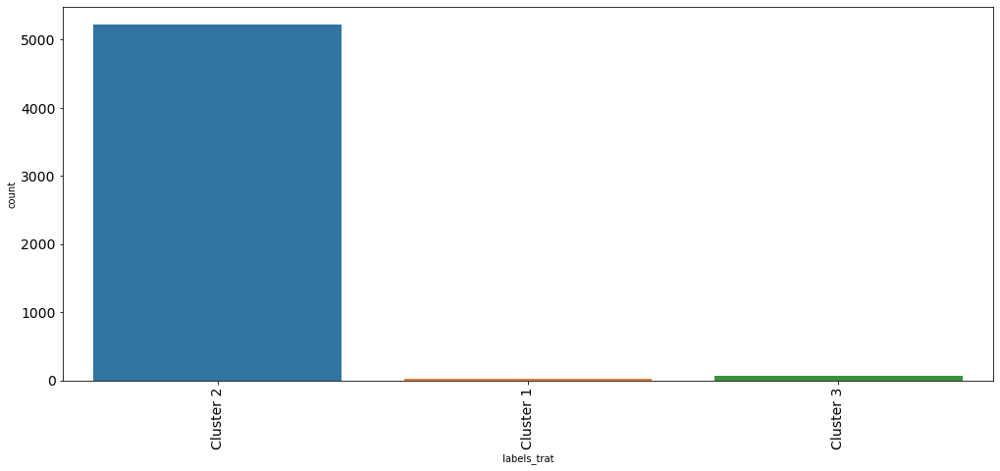

In [69]:
plt.rcParams['figure.figsize'] = [17, 7]
sns.countplot(x= "labels_trat", data = df_clus)
plt.xticks(rotation=90);

# Analise Descritiva

## Data / Hora / Dia da semana/ Mês

In [70]:
df_time = data_ocor[['codigo_ocorrencia',  'quater_ocorrencia', 'dia_ocorrencia', 
                     'mes_ocorrencia', 'semana_ocorrencia', 'hora', 'minuto', 
                     'ocorrencia_tipo', 'ocorrencia_classificacao']].dropna().copy()

df_time = df_time.drop_duplicates()

In [71]:
df_time["hora"] = df_time["hora"].astype(int)
df_time["minuto"] = df_time["minuto"].astype(int)

In [72]:
df_time = df_time.set_index("codigo_ocorrencia")

In [73]:
df_time['ocorrencia_tipo'] = df_time['ocorrencia_tipo'].str.replace('GERENCIAMENTO DE TRÁFEGO AÉREO (ATM) / SERVIÇO DE COMUNICAÇÃO NAVEGAÇÃO, OU VIGILÂNCIA (CNS)', 'GERENCIAMENTO TRAFEGO AEREO', regex=False)

### Quarter

In [74]:
df_time_quarter = df_time
df_time_quarter["quater_ocorrencia_count"] = df_time_quarter['quater_ocorrencia']
df_time_quarter = pd.DataFrame(df_time_quarter.groupby( ["ocorrencia_tipo", 'ocorrencia_classificacao', 'quater_ocorrencia'])['quater_ocorrencia_count'].count()).reset_index()

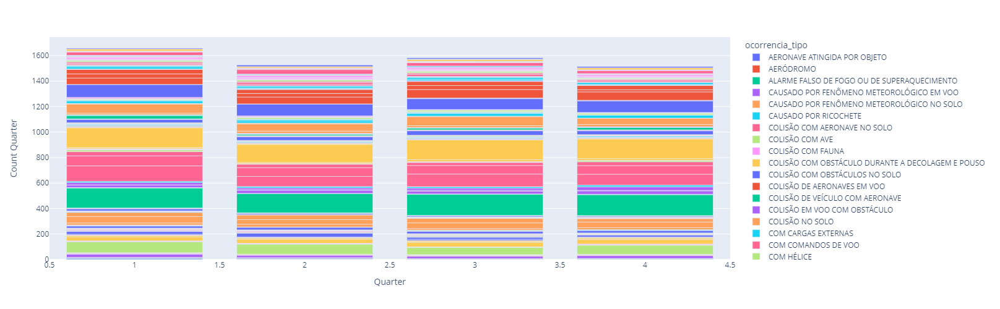

In [75]:
fig = px.bar(df_time_quarter,
             x = "quater_ocorrencia", 
             y='quater_ocorrencia_count',
             color  = 'ocorrencia_tipo',
             height = 500, width = 960)
fig.update_xaxes(title = "Quarter")
fig.update_yaxes(title = "Count Quarter")
fig.show()
#py.plot(fig, filename = 'ocorrencia_tipo_Quarter', auto_open=True)

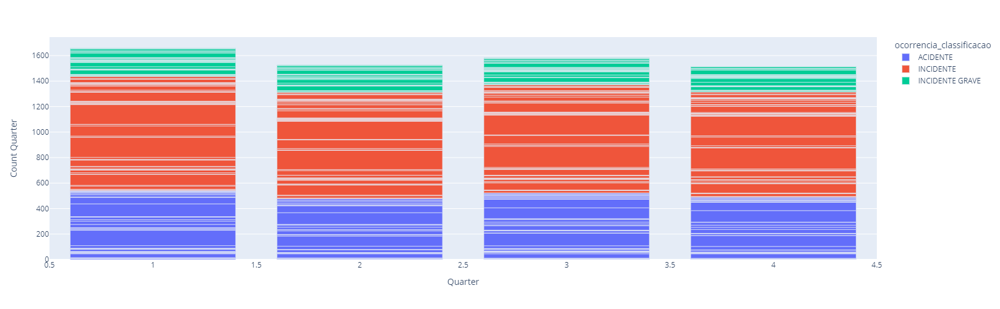

In [76]:
fig = px.bar(df_time_quarter,
             x = "quater_ocorrencia", 
             y='quater_ocorrencia_count',
             color  = 'ocorrencia_classificacao',
             height = 500, width = 960)
fig.update_xaxes(title = "Quarter")
fig.update_yaxes(title = "Count Quarter")
fig.show()
#py.plot(fig, filename = 'ocorrencia_classificacao_Quarter', auto_open=True)

### Dia do mês

In [77]:
df_time_dia = df_time
df_time_dia["dia_ocorrencia_count"] = df_time_dia['dia_ocorrencia']
df_time_dia = pd.DataFrame(df_time_dia.groupby( ["ocorrencia_tipo", 'ocorrencia_classificacao', 'dia_ocorrencia'])['dia_ocorrencia_count'].count()).reset_index()

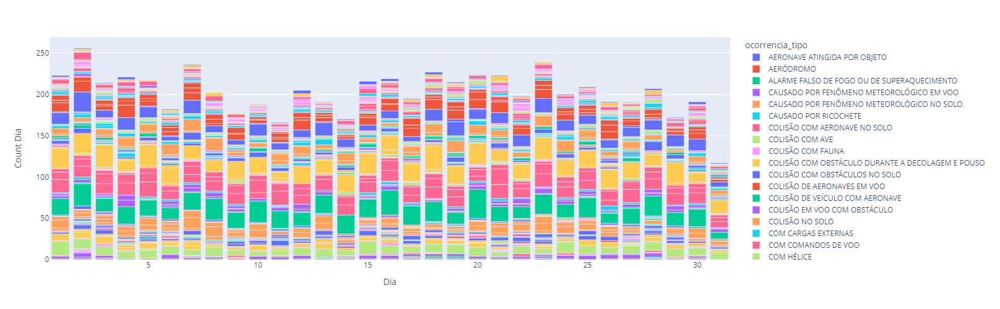

In [78]:
fig = px.bar(df_time_dia,
             x = "dia_ocorrencia", 
             y='dia_ocorrencia_count',
             color  = 'ocorrencia_tipo',
             height = 500, width = 960)
fig.update_xaxes(title = "Dia")
fig.update_yaxes(title = "Count Dia")
fig.show()
#py.plot(fig, filename = 'ocorrencia_tipo_dia', auto_open=True)

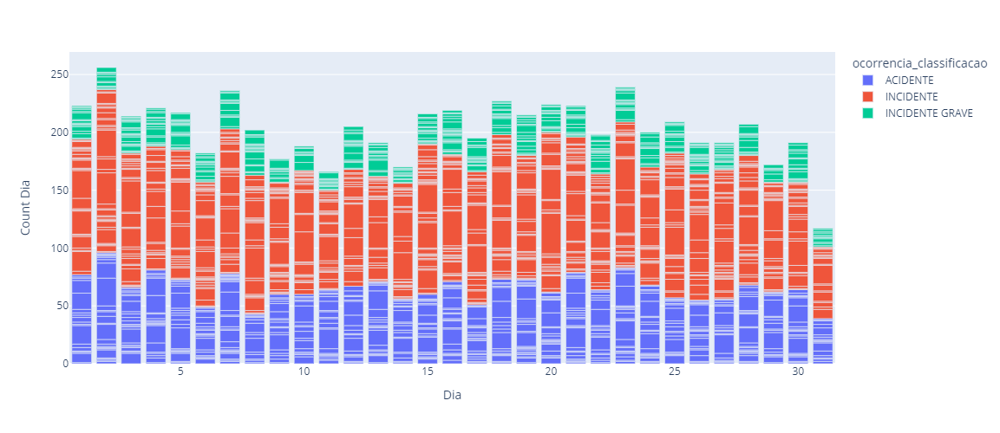

In [79]:
fig = px.bar(df_time_dia,
             x = "dia_ocorrencia", 
             y='dia_ocorrencia_count',
             color  = 'ocorrencia_classificacao',
             height = 500, width = 960)
fig.update_xaxes(title = "Dia")
fig.update_yaxes(title = "Count Dia")
fig.show()
#py.plot(fig, filename = 'ocorrencia_classificacao_dia', auto_open=True)

### Mês do Ano

In [80]:
df_time_mes = df_time
df_time_mes["mes_ocorrencia_count"] = df_time_mes['mes_ocorrencia']
df_time_mes = pd.DataFrame(df_time_mes.groupby( ["ocorrencia_tipo", 'ocorrencia_classificacao', 'mes_ocorrencia'])['mes_ocorrencia_count'].count()).reset_index()

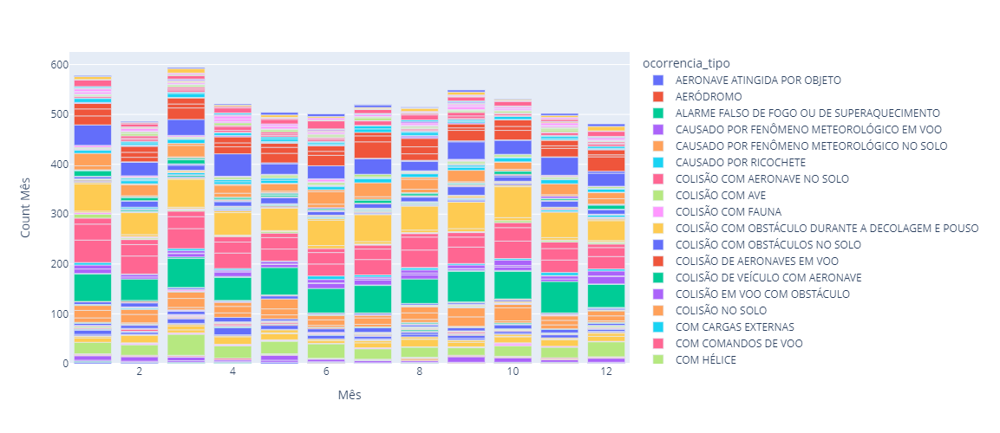

In [81]:
fig = px.bar(df_time_mes,
             x = "mes_ocorrencia", 
             y='mes_ocorrencia_count',
             color  = 'ocorrencia_tipo',
             height = 500, width = 960)
fig.update_xaxes(title = "Mês")
fig.update_yaxes(title = "Count Mês")
fig.show()
#py.plot(fig, filename = 'ocorrencia_tipo_mes', auto_open=True)

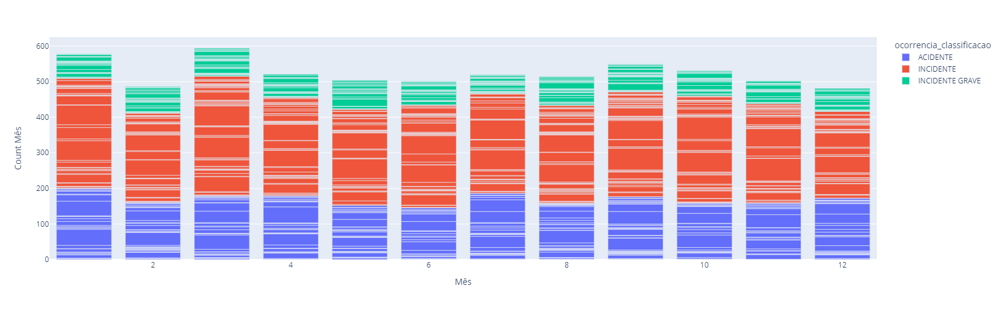

In [82]:
fig = px.bar(df_time_mes,
             x = "mes_ocorrencia", 
             y='mes_ocorrencia_count',
             color  = 'ocorrencia_classificacao',
             height = 500, width = 960)
fig.update_xaxes(title = "Mês")
fig.update_yaxes(title = "Count Mês")
fig.show()
#py.plot(fig, filename = 'ocorrencia_classificacao_mes', auto_open=True)

### Hora do dia

In [83]:
df_time_hora = df_time
df_time_hora["hora_count"] = df_time_hora['hora']
df_time_hora = pd.DataFrame(df_time_hora.groupby( ["ocorrencia_tipo", 'ocorrencia_classificacao', 'hora'])['hora_count'].count()).reset_index()

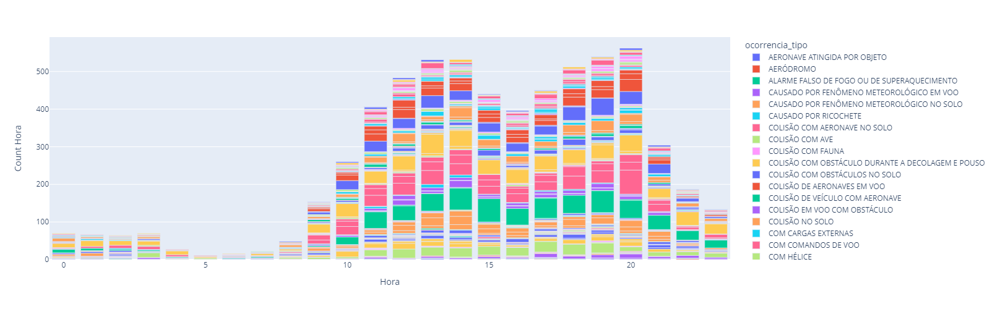

In [84]:
fig = px.bar(df_time_hora,
             x = "hora", 
             y='hora_count',
             color  = 'ocorrencia_tipo',
             height = 500, width = 960)
fig.update_xaxes(title = "Hora")
fig.update_yaxes(title = "Count Hora")
fig.show()
#py.plot(fig, filename = 'ocorrencia_tipo_hora', auto_open=True)

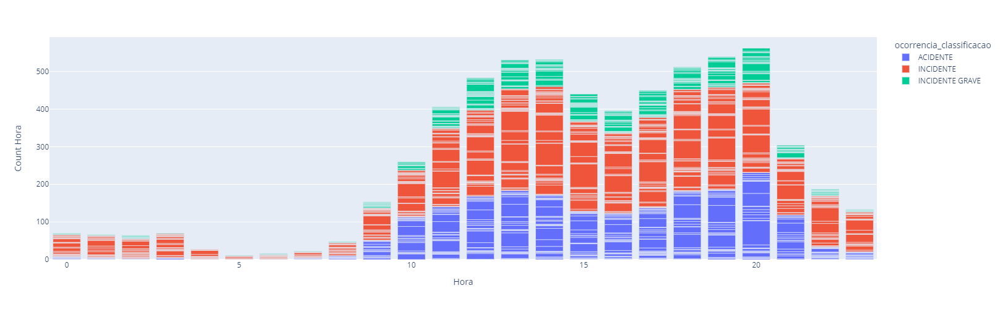

In [85]:
fig = px.bar(df_time_hora,
             x = "hora", 
             y='hora_count',
             color  = 'ocorrencia_classificacao',
             height = 500, width = 960)
fig.update_xaxes(title = "Hora")
fig.update_yaxes(title = "Count Hora")
fig.show()
#py.plot(fig, filename = 'ocorrencia_classificacao_hora', auto_open=True)

## Longitudinais e Latitudinais

### Tratamento para analise

In [86]:
df_map = data_ocor[['codigo_ocorrencia', 'ocorrencia_classificacao', 'ocorrencia_latitude',
                    'ocorrencia_longitude', 'ocorrencia_cidade', 'ocorrencia_uf', 'ocorrencia_tipo',
                    "aeronave_registro_categoria", "aeronave_motor_quantidade"]].dropna().copy()
df_map = df_map.drop_duplicates()
df_map = df_map.set_index("codigo_ocorrencia")

In [87]:
df_map_list = list(df_map[[ 'ocorrencia_classificacao', 'ocorrencia_latitude',
                           'ocorrencia_longitude', 'ocorrencia_cidade', 'ocorrencia_uf', 'ocorrencia_tipo',
                           "aeronave_registro_categoria", "aeronave_motor_quantidade",]])

for i in range(len(df_map_list)):
        df_map[f'{df_map_list[i]}'] = df_map[f'{df_map_list[i]}'].str.replace('***', 'SEM INFORMACAO', regex=False)
        df_map[f'{df_map_list[i]}'] = df_map[f'{df_map_list[i]}'].str.replace('SEM INFORMACAO*', 'SEM INFORMACAO', regex=False)

In [88]:
df_map['ocorrencia_tipo'] = df_map['ocorrencia_tipo'].str.replace('GERENCIAMENTO DE TRÁFEGO AÉREO (ATM) / SERVIÇO DE COMUNICAÇÃO NAVEGAÇÃO, OU VIGILÂNCIA (CNS)', 'GERENCIAMENTO TRAFEGO AEREO', regex=False)

### Conexãoo no Chart Studio do Plotyly

### Gráficos de Geolocalização

#### ocorrencia_tipo

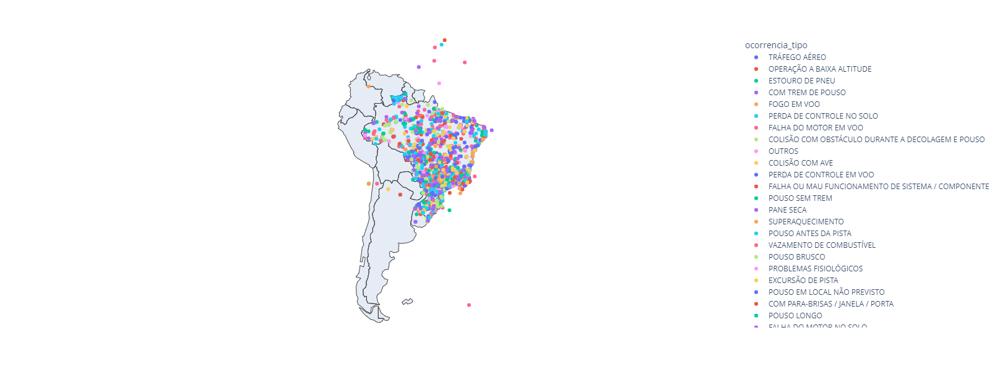

In [89]:
plot = px.scatter_geo(df_map, 
                      lat = 'ocorrencia_latitude',
                      lon = 'ocorrencia_longitude',
                      color = "ocorrencia_tipo",
                      scope = 'south america', 
                      hover_data= ["ocorrencia_tipo", "ocorrencia_classificacao"],
                      height = 610, width = 960) 
plot.show() 
#py.plot(plot, filename = 'ocorrencia_tipo', auto_open=True)

#### ocorrencia_classificacao

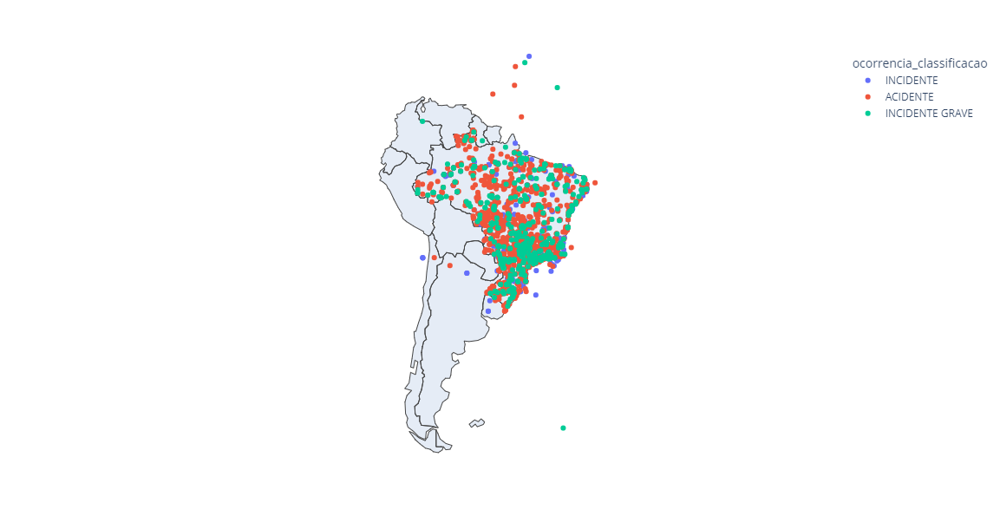

In [90]:
plot = px.scatter_geo(df_map, 
                      lat = 'ocorrencia_latitude',
                      lon = 'ocorrencia_longitude',
                      color = "ocorrencia_classificacao",
                      scope = 'south america', 
                      hover_data= ["ocorrencia_tipo", "ocorrencia_classificacao"],
                      height = 610, width = 960) 
plot.show() 
#py.plot(plot, filename = 'ocorr_class', auto_open=True)

#### Tipo de aeronave

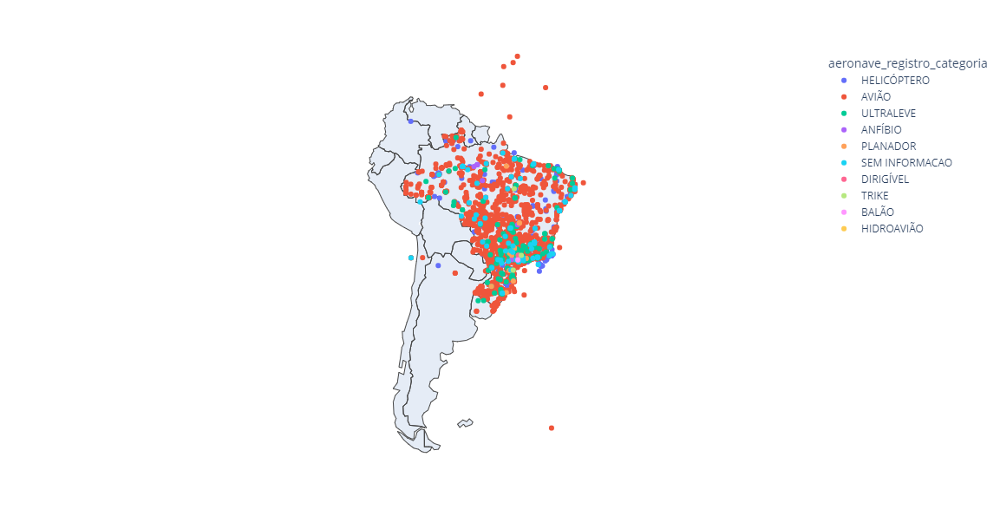

In [91]:
plot = px.scatter_geo(df_map, 
                      lat = 'ocorrencia_latitude',
                      lon = 'ocorrencia_longitude',
                      color = "aeronave_registro_categoria",
                      scope = 'south america', 
                      hover_data= ["ocorrencia_tipo", "ocorrencia_classificacao", 'aeronave_registro_categoria'],
                      height = 610, width = 960) 
plot.show() 
#py.plot(plot, filename = 'ocorr_aero', auto_open=True)

#### Tipo de motor

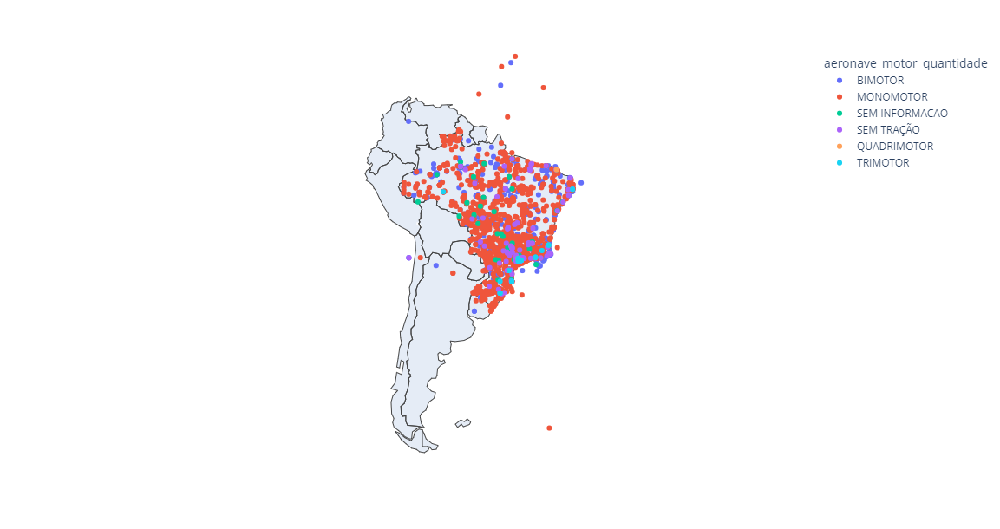

In [92]:
plot = px.scatter_geo(df_map, 
                      lat = 'ocorrencia_latitude',
                      lon = 'ocorrencia_longitude',
                      color = "aeronave_motor_quantidade",
                      scope = 'south america', 
                      hover_data= ["ocorrencia_tipo", "ocorrencia_classificacao", 'aeronave_registro_categoria','aeronave_motor_quantidade'],
                      height = 610, width = 960) 
plot.show() 
#py.plot(plot, filename = 'ocorr_quant_motor', auto_open=True)